# Tutorial for Map-Matching

> @File    :   Doc_2_Map_Matching.ipynb  
@Time    :   2023/11/18 15:34:02  
@Author  :   Qiuzi Chen   
@Version :   1.0  
@Contact :   qiuzi.chen@outlook.com  
@Desc    :   Tutorial and document for map-matching.

---

The map matching module is based on the python library `PyTrack`.

> ref: <https://github.com/cosbidev/PyTrack.git>

In [2]:
import numpy as np
import pandas as pd

# 1 Map-matching

`PyTrack` perfroms map-matchig based on a Hidden-Markov Model. Three steps are required for it:
1. Generate candidates for each point.
2. Extract a trellis DAG graph.
3. Perform viterbi search algorithm. 

> A modification was made to avoid ``no candidates`` error in `trajtool.mapMatching`.  
> To be specific, when no candidates are found for some points in the trajectory, the `candidate.elab_candidate_results` function will collapse due to `Key error`. In `trajtool`, we updated no-candidate results as an input to this function to avoid collapse.

In [3]:
# read traj
traj = pd.read_csv("./data/traj/sample_detected.csv")
traj.head()

,vehID,orderID,tripID,time[s],lon,lat,dist[km],interval[s],speed[km/h],acc[m/s2],grade[D],VSP[kW/t],braking,OpModeID
0,0.0,0.0,0.0,1.477969e+09,104.070087,30.731888,0.007380,1.0,32.384280,-3.726805,0.0,-34.847050,True,0
1,0.0,0.0,0.0,1.477969e+09,104.070087,30.731822,0.004364,1.0,20.712196,-1.527181,0.0,-11.883306,True,0
2,0.0,0.0,0.0,1.477969e+09,104.070082,30.731783,0.003779,1.0,15.737670,0.747944,0.0,1.295606,False,12
3,0.0,0.0,0.0,1.477969e+09,104.070070,30.731750,0.005502,1.0,18.587265,2.996978,0.0,16.113796,False,16
4,0.0,0.0,0.0,1.477969e+09,104.070051,30.731704,0.009463,1.0,29.423483,5.278276,0.0,47.246746,False,16


`PyTrack` extracts road graph from osm directly according to a bounding box of the input coordinates. Extractions are performed using `requests` module.  

Please ensure the connectivity of the Internet.

In [4]:
from mapmatch import Matcher

matcher = Matcher(engine='pytrack')
traj = matcher.match(traj)
traj.head()

Graph extracting...
Downloaded 1,811.08kB


Map-matching: 100%|██████████| 11/11 [00:08<00:00,  1.24it/s]


,vehID,orderID,tripID,time[s],lon,lat,dist[km],interval[s],speed[km/h],acc[m/s2],grade[D],VSP[kW/t],braking,OpModeID,osmid
0,0.0,0.0,0.0,1.477969e+09,104.070087,30.731888,0.007380,1.0,32.384280,-3.726805,0.0,-34.847050,True,0,None
1,0.0,0.0,0.0,1.477969e+09,104.070087,30.731822,0.004364,1.0,20.712196,-1.527181,0.0,-11.883306,True,0,None
2,0.0,0.0,0.0,1.477969e+09,104.070082,30.731783,0.003779,1.0,15.737670,0.747944,0.0,1.295606,False,12,None
3,0.0,0.0,0.0,1.477969e+09,104.070070,30.731750,0.005502,1.0,18.587265,2.996978,0.0,16.113796,False,16,None
4,0.0,0.0,0.0,1.477969e+09,104.070051,30.731704,0.009463,1.0,29.423483,5.278276,0.0,47.246746,False,16,None


In [5]:
traj[~traj['osmid'].isna()]

,vehID,orderID,tripID,time[s],lon,lat,dist[km],interval[s],speed[km/h],acc[m/s2],grade[D],VSP[kW/t],osmid
508,0.0,0.0,2.0,1.477970e+09,104.094809,30.711877,0.007716,1.0,35.405457,-1.755613,0.0,-29.717453,137130750
509,0.0,0.0,2.0,1.477970e+09,104.094885,30.711854,0.007485,1.0,29.483807,0.154507,0.0,-3.119847,137130750
510,0.0,0.0,2.0,1.477970e+09,104.094962,30.711840,0.008458,1.0,30.159600,0.805633,0.0,6.311339,137130750
511,0.0,0.0,2.0,1.477970e+09,104.095040,30.711805,0.009543,1.0,33.095745,0.505840,0.0,5.397805,137129174
512,0.0,0.0,2.0,1.477970e+09,104.095115,30.711749,0.009920,1.0,34.927532,-0.060676,0.0,0.554886,137129174
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2652,0.0,4.0,11.0,1.477983e+09,104.043225,30.704992,0.011768,1.0,42.088410,-1.356198,0.0,-14.138473,577379395
2653,0.0,4.0,11.0,1.477983e+09,104.043123,30.704933,0.009754,1.0,37.206097,-2.660773,0.0,-25.209267,577379395
2654,0.0,4.0,11.0,1.477983e+09,104.043039,30.704884,0.006534,1.0,27.627314,-1.874143,0.0,-14.010430,577379395
2655,0.0,4.0,11.0,1.477983e+09,104.042983,30.704850,0.004997,1.0,20.880402,0.044494,0.0,-0.753624,100305570


In [4]:
# traj.to_csv("./data/traj/sample_matched.csv", index=False)

# 2 Visualizaiton

In [52]:
# Get matched path
matched = []
for i in range(len(results)):
    id = np.argwhere(results[i]['candidate_type'] == True)[0][0]
    matched.append(results[i]['candidates'][id])

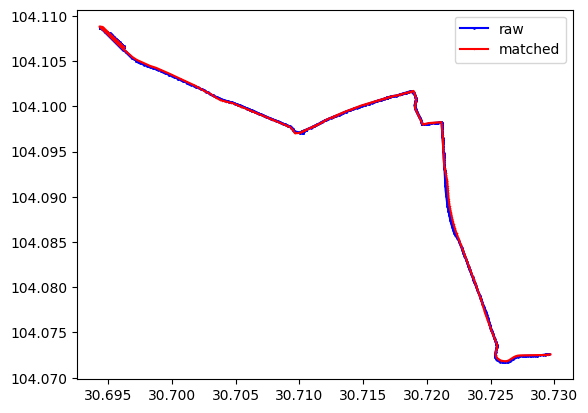

In [53]:
import matplotlib.pyplot as plt

plt.plot([i[0] for i in points], [i[1] for i in points], '-b', marker='o', markersize=1, label='raw')
plt.plot([i[0] for i in matched], [i[1] for i in matched], '-r', marker='^', markersize=0.2, label='matched')
plt.legend()

`PyTrack` also integrates some visualization tools.

In [54]:
# Initialize maps
loc = (np.mean(traj['lat']), np.mean(traj['lon']))
maps = visualization.Map(location=loc, zoom_start=15)
maps.add_graph(G, plot_nodes=True)
maps.draw_candidates(candidates, 30)
maps.draw_path(G_interp, trellis, predecessor)
maps

# 3 Tunning

We intergrated `PyTrack` in `trajtool` and seleted tunned parameters considering calculating time and matching effect.

In [55]:
from trajtool import Traj

roadnet = pd.read_csv("./data/geo/roadnet_edge.csv")

traj1 = Traj(traj)
traj2 = Traj(traj)
traj3 = Traj(traj)

traj1.mapMatch(roadnet, interp_dist=10, dropCoord=False)
traj2.mapMatch(roadnet, interp_dist=20, dropCoord=False)
traj3.mapMatch(roadnet, interp_dist=30, dropCoord=False)

map-matching trip No.: 100%|██████████| 1/1 [01:21<00:00, 81.07s/it]


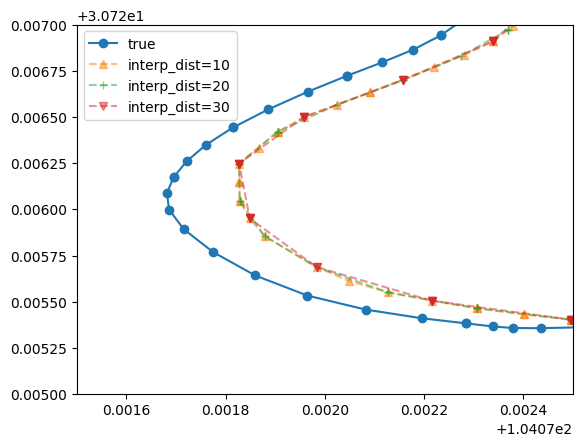

In [67]:
import matplotlib.pyplot as plt

plt.plot(traj1.df['lon'], traj1.df['lat'], '-o', label='true')
plt.plot(traj1.df['mapLon'], traj1.df['mapLat'], '--^', alpha=0.5, label='interp_dist=10')
plt.plot(traj2.df['mapLon'], traj2.df['mapLat'], '--+', alpha=0.5, label='interp_dist=20')
plt.plot(traj3.df['mapLon'], traj3.df['mapLat'], '--v', alpha=0.5, label='interp_dist=30')

plt.xlim(104.0715, 104.0725)
plt.ylim(30.725, 30.727)

plt.legend()

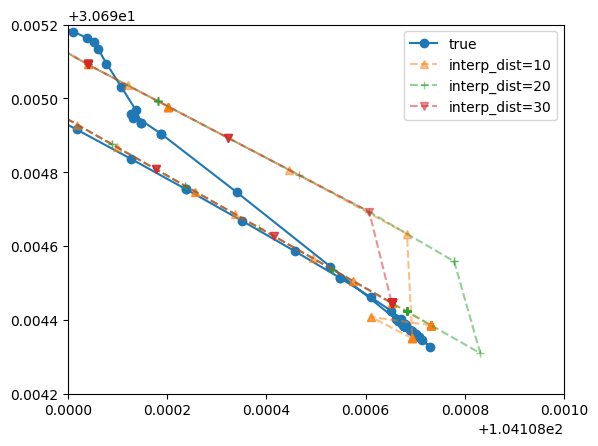

In [76]:
plt.plot(traj1.df['lon'], traj1.df['lat'], '-o', label='true')
plt.plot(traj1.df['mapLon'], traj1.df['mapLat'], '--^', alpha=0.5, label='interp_dist=10')
plt.plot(traj2.df['mapLon'], traj2.df['mapLat'], '--+', alpha=0.5, label='interp_dist=20')
plt.plot(traj3.df['mapLon'], traj3.df['mapLat'], '--v', alpha=0.5, label='interp_dist=30')

plt.xlim(104.108, 104.109)
plt.ylim(30.6942, 30.6952)

plt.legend()

In [68]:
roadnet['length'].describe()

count    31273.000000
mean       198.274646
std        242.565323
min          0.555000
25%         57.050000
50%        143.280000
75%        251.576000
max       6648.734000
Name: length, dtype: float64

The `interp_dist` is the distance between two adjacent interpolated points. The smaller the distance, the higher the accuracy, and the longer the calculating time.  

In application, the length of road segments in openstreepmap are in a range of 0.5 to 6648 meters with an average of around 140 meters. Considering the calculate efficiency, we decided to use `interp_dist=30` as the defaul value, and the default `radius` is set to 20.

Tunning.

In [1]:
# input data
import pandas as pd
from mapmatch import Matcher

traj = pd.read_csv("./data/traj/sample10000_preprocessed.csv")
traj = traj.loc[:5000]

In [2]:
results = {
    "interp_dist": [],
    "radius": [],
    "cpu time": [],
    "number of null": []
}

import time
for dist in [10, 20, 30]:
    for radius in [15, 20, 30]:
        
        results["interp_dist"].append(dist)
        results["radius"].append(radius)
        
        tik = time.time()
        matcher = Matcher(engine='pytrack')
        trip = matcher.match(traj, interp_dist=dist, radius=radius)
        tok = time.time()        

        results["cpu time"].append(tok-tik)
        results["number of null"].append(trip[trip.osmid.isnull()].shape[0])

Graph extracting...
Downloaded 2,230.30kB


Map-matching: 100%|██████████| 21/21 [00:46<00:00,  2.20s/it]


In [3]:
df = pd.DataFrame(results)
df['time per trip'] = df['cpu time'] / len(traj['tripID'].unique())
df['unmatched rate'] = df['number of null'] / 10000
df.to_csv("./data/tunning.csv")

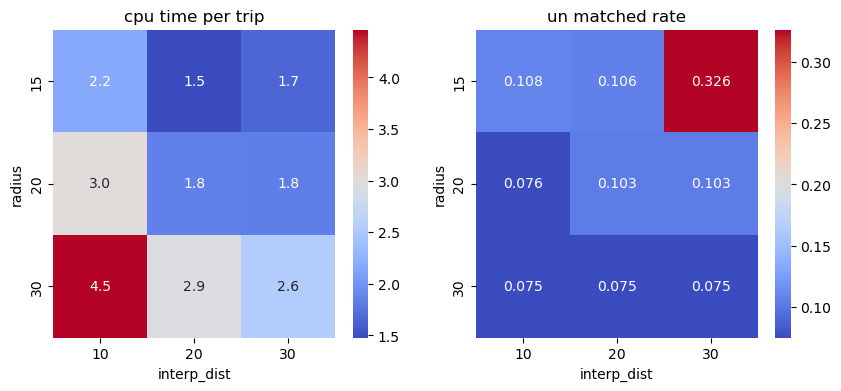

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv("./data/tunning.csv")
fig, ax = plt.subplots(1,2, figsize=(10,4))

ax[0].set_title("cpu time per trip")
sns.heatmap(
    df['time per trip'].to_numpy().reshape(3,3).transpose(),
    xticklabels=['10', '20', '30'],
    yticklabels=['15', '20', '30'],
    cmap="coolwarm",
    annot=True,
    fmt=".1f",
    cbar=True,
    ax=ax[0],
)

ax[1].set_title("un matched rate")
sns.heatmap(
    df['unmatched rate'].to_numpy().reshape(3,3).transpose(),
    xticklabels=['10', '20', '30'],
    yticklabels=['15', '20', '30'],
    cmap="coolwarm",
    annot=True,
    fmt=".3f",
    cbar=True,
    ax=ax[1],
)

for x in ax:
    x.set_xlabel("interp_dist")
    x.set_ylabel("radius")

# Appendix: Roadnet Extraction

## A1 Extract graph as GeoDataFrame

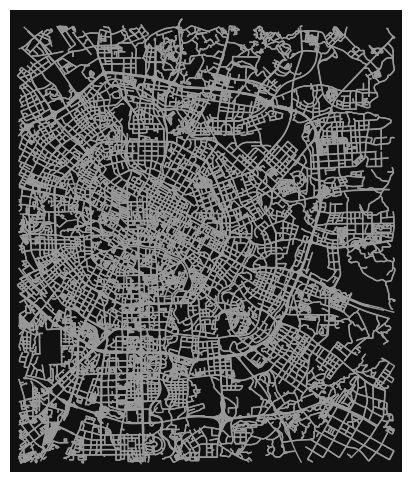

(<Figure size 600x600 with 1 Axes>, <Axes: >)

In [27]:
# get road network from a bounding box
import osmnx as ox

north, south, east, west = 30.75, 30.55, 104.20, 104
custom_filter = ('["highway"]["area"!~"yes"]["access"!~"private"]'
                 '["highway"!~"abandoned|bridleway|bus_guideway|construction|corridor|cycleway|'
                 'elevator|escalator|footway|path|pedestrian|planned|platform|proposed|raceway|steps|track"]'
                 '["service"!~"emergency_access|private"]')
graph = ox.graph_from_bbox(
    north, south, east, west,
    simplify=True,
    custom_filter=custom_filter,
)

ox.plot_graph(graph, node_size=0, figsize=(6,6))

In [28]:
# save as GeoDataFrame
roadnet = ox.graph_to_gdfs(graph, nodes=False)
roadnet = roadnet.explode('osmid')
roadnet.to_csv("./data/geo/roadnet.csv", index=False, encoding='utf_8_sig')

## A2 Simplify the roadnet by information merging

In [66]:
import numpy as np

# step1: merge highway type
roadnet_merge = roadnet.copy()

# define road type orders
highway_types = ["motorway", "trunk", "primary", "secondary", "tertiary", "unclassified", "residential",
                 "motorway_link", "trunk_link", "primary_link", "secondary_link", "tertiary_link", "living_street",
                 "service"]

def highway_merge(highway):
    if type(highway) == str:
        return highway
    else:
        # if there are two or more than highway types in the list, return the one with the highest class
        index = [highway_types.index(i) for i in highway]
        return highway[np.argmin(index)]
# merge
roadnet_merge['highway'] = roadnet['highway'].apply(highway_merge)

In [68]:
import pandas as pd
from tqdm import tqdm
from shapely import ops, multilinestrings

# step2: merge geometry
roadnet_simplified = {"osmid":[], "road type":[], "geometry":[], "length":[]}

for osmid in tqdm(roadnet_merge.osmid.unique()):
    
    road = roadnet_merge[roadnet_merge["osmid"] == osmid]

    # add osmid
    roadnet_simplified["osmid"].append(osmid)

    # add road type
    roadTypes = road["highway"].tolist()
    # get the count of each type
    typeCounts = {t:roadTypes.count(t) for t in set(roadTypes)}
    # get the type with the most count
    maxTypes = [t for t in typeCounts.keys() if typeCounts[t] == max(typeCounts.values())]
    # if there are more than two types, return the one with the highest class
    roadnet_simplified["road type"].append(roadTypes[np.argmin([highway_types.index(i) for i in roadTypes])])

    # add geometry
    roadnet_simplified["geometry"].append(ops.linemerge(multilinestrings(road["geometry"].to_list())))
    
    # add length
    roadnet_simplified["length"].append(road["length[m]"].sum())

roadnet_simplified = pd.DataFrame(roadnet_simplified)

100%|██████████| 13363/13363 [01:11<00:00, 186.16it/s]


In [71]:
roadnet_simplified

,osmid,road type,geometry,length[m]
0,136004881,primary,"LINESTRING (104.0642752 30.6274009, 104.064313...",1220.989
1,136011448,primary_link,"LINESTRING (104.0644066 30.6233215, 104.064314...",384.318
2,136011380,primary_link,"LINESTRING (104.0644066 30.6233215, 104.064314...",384.318
3,136011447,primary_link,"LINESTRING (104.0644066 30.6233215, 104.064314...",447.424
4,136004891,primary,"LINESTRING (104.06446 30.6216883, 104.0644765 ...",894.418
...,...,...,...,...
13358,1223252515,service,"MULTILINESTRING ((104.143795 30.7317135, 104.1...",797.468
13359,1223252516,service,"MULTILINESTRING ((104.1437169 30.7317278, 104....",482.366
13360,1223252517,service,"LINESTRING (104.1437169 30.7317278, 104.143795...",15.264
13361,1223669498,service,"LINESTRING (104.1308533 30.7424192, 104.130971...",66.218


In [73]:
roadnet_simplified.describe()

,osmid,length[m]
count,1.336300e+04,13363.000000
mean,6.174665e+08,664.998512
std,2.813119e+08,717.512501
min,2.537339e+07,5.404000
25%,4.632712e+08,216.424000
50%,5.876091e+08,453.158000
75%,8.364337e+08,856.694000
max,1.225333e+09,11197.761000


In [74]:
# save as csv
roadnet_simplified.to_csv("./data/geo/roadnet_simplified.csv", index=False)

In [84]:
# save as shapefile
import geopandas as gpd
gdf = gpd.GeoDataFrame(roadnet_simplified, geometry="geometry")
gdf.to_file("./data/geo/roadnet_simplified.shp")